In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import geopandas as gpd


import folium
from folium import Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster



# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/worcestershire-row-csv/wo(10).csv


In [3]:

data_fp = gpd.read_file("https://www.rowmaps.com/jsons/WO/mutated1.json", delimiter='|', axis=0)
data_fp.crs = {'init':'epsg:4326'}
data_br = gpd.read_file("https://www.rowmaps.com/jsons/WO/mutated2.json", delimiter='|', axis=0)
data_br.crs = {'init':'epsg:4326'}
data_rb = gpd.read_file("https://www.rowmaps.com/jsons/WO/mutated3.json", delimiter='|', axis=0)
data_rb.crs = {'init':'epsg:4326'}
data_bw = gpd.read_file("https://www.rowmaps.com/jsons/WO/mutated4.json", delimiter='|', axis=0)
data_bw.crs = {'init':'epsg:4326'}

#data_csv = pd.read_csv('../input/worcestershire-row-csv/wo(10).csv', delimiter='|')

Worc_fp = gpd.GeoDataFrame(data_fp)
Worc_br = gpd.GeoDataFrame(data_br)
Worc_rb = gpd.GeoDataFrame(data_rb)
Worc_bw = gpd.GeoDataFrame(data_bw)



/opt/conda/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [4]:
Worc_fp

,Name,Description,Attribution,geometry
0,WO|UPPER ARLEY|531(D),Fo|WO:1|0.108|UA-531|-2.29717|52.44795|-2.2986...,The data in this GeoJSON file has been obtaine...,"LINESTRING (-2.29717 52.44795, -2.29865 52.44922)"
1,WO|UPPER ARLEY|532(C),Fo|WO:2|0.163|UA-532|-2.28973|52.44776|-2.2934...,None,"LINESTRING (-2.28973 52.44776, -2.29055 52.447..."
2,WO|UPPER ARLEY|533(C),Fo|WO:4|0.295|UA-533|-2.28725|52.44541|-2.2934...,None,"LINESTRING (-2.28725 52.44541, -2.28831 52.445..."
3,WO|UPPER ARLEY|530(D),Fo|WO:5|0.236|UA-530|-2.30678|52.44401|-2.3040...,None,"LINESTRING (-2.30678 52.44401, -2.30673 52.444..."
4,WO|HAGLEY|530(C),Fo|WO:6|0.434|HE-530|-2.09285|52.44499|-2.0996...,None,"LINESTRING (-2.09285 52.44499, -2.09289 52.444..."
...,...,...,...,...
13298,WO|GRAFTON FLYFORD|556(C),Fo|WO:15765|0.157|GF-556|-2.05525|52.20051|-2....,None,"LINESTRING (-2.05525 52.20051, -2.05553 52.200..."
13299,WO|BELBROUGHTON|509(C),Fo|WO:15766|0.397|BB-509|-2.12533|52.39407|-2....,None,"LINESTRING (-2.12533 52.39407, -2.12718 52.394..."
13300,WO|CLIFTON ON TEME|608(C),Fo|WO:15768|0.196|CT-608|-2.42094|52.25340|-2....,None,"LINESTRING (-2.42094 52.25340, -2.42104 52.253..."
13301,WO|RIPPLE|501(C),Fo|WO:15769|0.133|RP-501|-2.21530|52.07076|-2....,None,"LINESTRING (-2.21530 52.07076, -2.21528 52.070..."


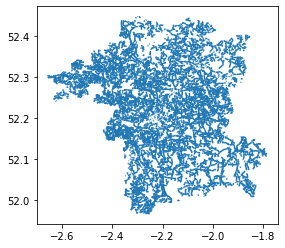

In [5]:
Worc_fp.plot()

In [ ]:

Worc_fp.head()

In [6]:

m_1 = folium.Map(location=[52.1962, -2.2749], tiles='openstreetmap', zoom_start=10)
folium.Choropleth(Worc_fp[Worc_fp.geometry.length>0.001],line_weight=1.5,
    line_color='blue').add_to(m_1)
folium.Choropleth(Worc_br[Worc_br.geometry.length>0.001],line_weight=1.5,
    line_color='red').add_to(m_1)
folium.Choropleth(Worc_rb[Worc_rb.geometry.length>0.001],line_weight=1.5,
    line_color='orange').add_to(m_1)
folium.Choropleth(Worc_bw[Worc_bw.geometry.length>0.001],line_weight=1.5,
    line_color='purple').add_to(m_1)
m_1

    

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:6: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a proj

In [18]:
path1 =   Worc_fp.iloc[200].loc['Name']
path1

'WO|ROMSLEY|513(B)'

In [36]:
WO_Romsley_513 = Worc_fp.iloc[200]
path1 =  Worc_fp.iloc[200].loc['Name']
path2 =  Worc_fp.iloc[33].loc['Name']
WO_Woverly_and_Cookley_553 = Worc_fp.iloc[33]
distances = WO_Romsley_513.geometry.distance(WO_Woverly_and_Cookley_553.geometry)

print(f'The distance from {path1} to {path2} is {round(distances*100)} km')
      
#print('The distance from {path1a} to {path2a} is {distances} km'.format(round(distances*100),path1a= path1 ,path2a=path2))

The distance from WO|ROMSLEY|513(B) to WO|WOLVERLEY AND COOKLEY|553(B) is 18 km


KeyError: 'distances'

In [ ]:
def read_geojson(url_list, geog1, geog2): 
    for URL in url_list:
        data_fp = gpd.read_file(URL, delimiter='|', axis=0)
        data_fp.set_crs(epsg=4326)
        data_br = gpd.read_file(URL, delimiter='|', axis=0)
        data_br.set_crs(epsg=4326)
        data_rb = gpd.read_file(URL, delimiter='|', axis=0)
        data_rb.set_crs(epsg=4326)
        data_bw = gpd.read_file(URL, delimiter='|', axis=0)
        data_bw.set_crs(epsg=4326)
    
    
    m_1 = folium.Map(location=[geog1, geog2], tiles='openstreetmap', zoom_start=10)
    folium.Choropleth(data_fp[data_fp.geometry.length>0.001],line_weight=1.5,
        line_color='blue').add_to(m_1)
    folium.Choropleth(data_br[data_br.geometry.length>0.001],line_weight=1.5,
        line_color='red').add_to(m_1)
    folium.Choropleth(data_rb[data_rb.geometry.length>0.001],line_weight=1.5,
        line_color='orange').add_to(m_1)
    folium.Choropleth(data_bw[data_bw.geometry.length>0.001],line_weight=1.5,
        line_color='purple').add_to(m_1)
m_1


In [ ]:
read_geojson(['https://www.rowmaps.com/jsons/WO/mutated1.json', 'https://www.rowmaps.com/jsons/WO/mutated2.json','https://www.rowmaps.com/jsons/WO/mutated3.json', 'https://www.rowmaps.com/jsons/WO/mutated4.json'], 52.1962, -2.2749)